## Generative AI and Large Language Models

covers:
1. **Generative AI Fundamentals** - Core concepts and architectures
2. **Diffusion Models** - Stable Diffusion for text-to-image generation
3. **Large Language Models** - Transformer architecture and text generation
4. **Text-to-Audio** - Speech synthesis models
5. **Image Super-Resolution** - Neural upscaling techniques

Each section includes:
- Theoretical concepts
- Architecture visualizations
- Interactive demonstrations
- Practical applications

In [1]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display, HTML
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed
import warnings
warnings.filterwarnings('ignore')

# Configuration
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (12, 6)
np.random.seed(42)

print("✓ Libraries imported successfully")

✓ Libraries imported successfully


---
# Part 1: Generative AI Fundamentals

## 1.1 What is Generative AI?

Generative AI creates new content (images, text, audio) rather than just classifying existing data.

### Discriminative vs Generative Models

**Discriminative Models**: Learn decision boundaries
- Input: Data (X)
- Output: Label or prediction (Y)
- Examples: Image classification, sentiment analysis
- Goal: Model P(Y|X) - probability of label given data

**Generative Models**: Learn data distributions
- Input: Random noise (Z) + optional condition
- Output: Generated data
- Examples: Text generation, image synthesis
- Goal: Model P(X) or P(X|Z) - probability of data

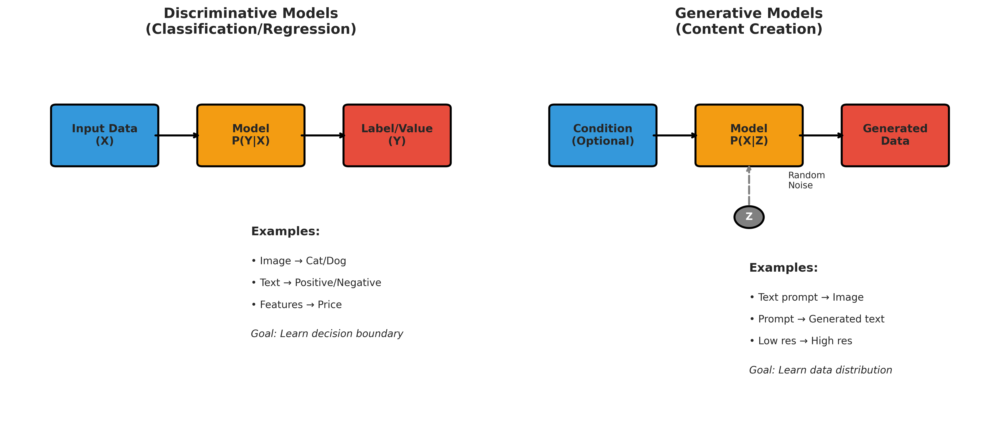

In [2]:
# Display comparison diagram
display(Image('diagrams/generative_vs_discriminative.png'))

## 1.2 Core Concepts

### Latent Space
- Compressed representation of data
- Lower dimensional than original data
- Captures essential features
- Example: 512×512 image → 64×64 latent (48× compression)

### Embeddings
- Dense vector representations
- Semantic meaning encoded in position
- Similar concepts have similar vectors
- Example: "cat" and "dog" are closer than "cat" and "car"

### Probability Distributions
- Generative models learn P(data)
- Sampling from distribution creates new examples
- Temperature controls randomness

In [3]:
# Interactive: Latent space visualization
def visualize_latent_space(n_points=200, noise_level=0.1):
    """Visualize 2D latent space representation"""
    # Generate clusters representing different conceptsa
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    # Cluster centers (different concepts)
    centers = {
        'animals': (2, 2),
        'vehicles': (-2, -2),
        'buildings': (-2, 2),
        'nature': (2, -2)
    }
    
    colors = ['red', 'blue', 'green', 'orange']
    
    for (concept, center), color in zip(centers.items(), colors):
        # Generate points around center
        points = np.random.randn(n_points//4, 2) * noise_level + center
        ax1.scatter(points[:, 0], points[:, 1], c=color, label=concept, 
                   alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
    
    ax1.set_xlabel('Latent Dimension 1', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Latent Dimension 2', fontsize=12, fontweight='bold')
    ax1.set_title('2D Latent Space\n(Similar concepts cluster together)', 
                 fontsize=13, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    ax1.axhline(y=0, color='k', linewidth=0.5)
    ax1.axvline(x=0, color='k', linewidth=0.5)
    
    # Interpolation demonstration
    start = centers['animals']
    end = centers['vehicles']
    t = np.linspace(0, 1, 20)
    interp_points = np.array([start]) * (1 - t[:, None]) + np.array([end]) * t[:, None]
    
    ax2.scatter(*start, c='red', s=200, marker='*', edgecolors='black', 
               linewidth=2, label='Start: Animal', zorder=5)
    ax2.scatter(*end, c='blue', s=200, marker='*', edgecolors='black', 
               linewidth=2, label='End: Vehicle', zorder=5)
    ax2.plot(interp_points[:, 0], interp_points[:, 1], 'k--', 
            linewidth=2, alpha=0.5, label='Interpolation path')
    ax2.scatter(interp_points[:, 0], interp_points[:, 1], c=t, 
               cmap='RdYlBu', s=100, edgecolors='black', linewidth=1, zorder=3)
    
    ax2.set_xlabel('Latent Dimension 1', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Latent Dimension 2', fontsize=12, fontweight='bold')
    ax2.set_title('Latent Space Interpolation\n(Smooth transitions between concepts)', 
                 fontsize=13, fontweight='bold')
    ax2.legend(fontsize=10)
    ax2.grid(True, alpha=0.3)
    ax2.axhline(y=0, color='k', linewidth=0.5)
    ax2.axvline(x=0, color='k', linewidth=0.5)
    
    plt.tight_layout()
    plt.show()

# Interactive controls
interact(visualize_latent_space, 
         n_points=widgets.IntSlider(min=100, max=400, step=50, value=200, description='Points:'),
         noise_level=widgets.FloatSlider(min=0.05, max=0.5, step=0.05, value=0.1, description='Spread:'));

interactive(children=(IntSlider(value=200, description='Points:', max=400, min=100, step=50), FloatSlider(valu…

### Key Takeaways: Generative AI Fundamentals

✓ **Generative models** create new content vs discriminative models classify

✓ **Latent spaces** provide compressed, meaningful representations

✓ **Similar concepts cluster** in latent space

✓ **Interpolation** enables smooth transitions between concepts

---
# Part 2: Diffusion Models (Stable Diffusion)

## 2.1 What are Diffusion Models?

Diffusion models generate images by **gradually removing noise**.

### Two Processes:

**Forward Diffusion** (Training)
- Start with real image
- Gradually add noise over T steps
- End with pure random noise
- Process: Clean Image → Noisy Image → Pure Noise

**Reverse Diffusion** (Generation)
- Start with random noise
- Gradually remove noise using learned model
- End with clean generated image
- Process: Pure Noise → Denoised Image → Clean Image

### Key Innovation: Latent Diffusion
- Stable Diffusion works in **latent space** (64×64×4)
- Not in pixel space (512×512×3)
- 48× more efficient
- Enables consumer GPU usage

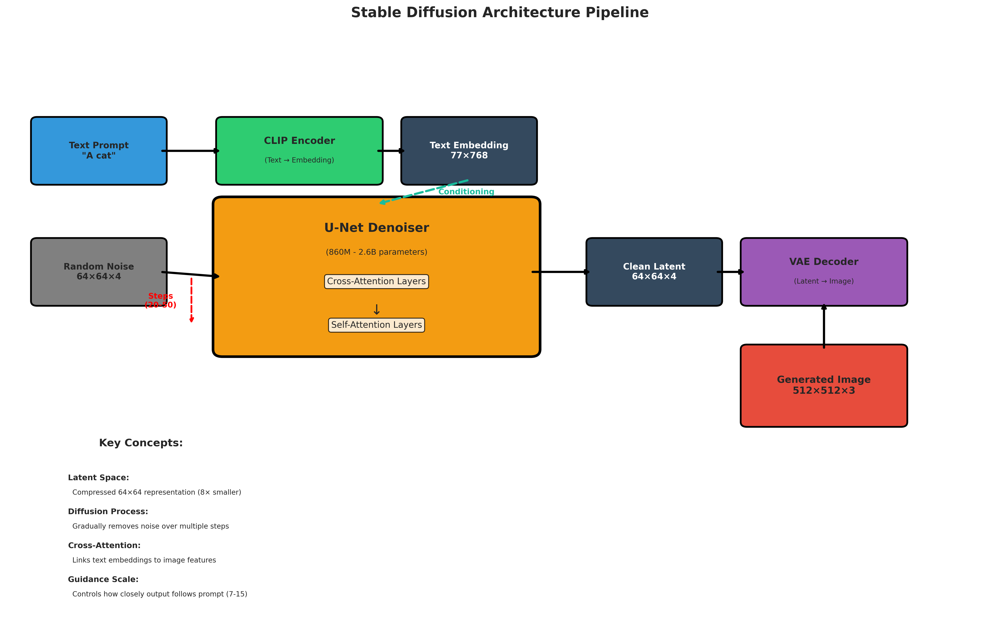

In [4]:
# Display architecture
display(Image('diagrams/stable_diffusion_architecture.png'))

## 2.2 Stable Diffusion Components

### 1. CLIP Text Encoder
- Converts text prompt to embeddings
- Output: 77 tokens × 768 dimensions
- Captures semantic meaning

### 2. U-Net Denoiser
- Core of diffusion process
- 860M - 2.6B parameters
- **Cross-attention**: Links text to image features
- **Self-attention**: Processes image context
- Iteratively removes noise (20-50 steps)

### 3. VAE (Variational Autoencoder)
- **Encoder**: 512×512×3 → 64×64×4 (compress)
- **Decoder**: 64×64×4 → 512×512×3 (reconstruct)
- Enables efficient latent space operations

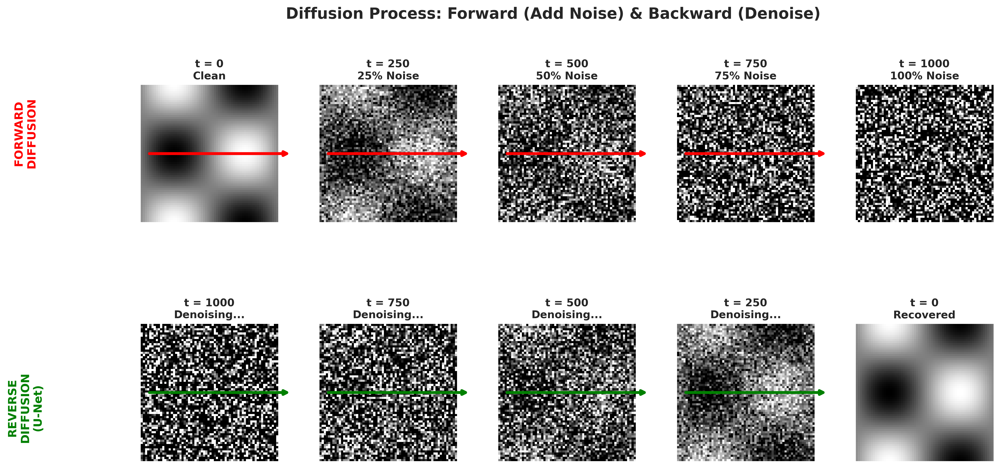

In [5]:
# Display diffusion process
display(Image('diagrams/diffusion_forward_backward.png'))

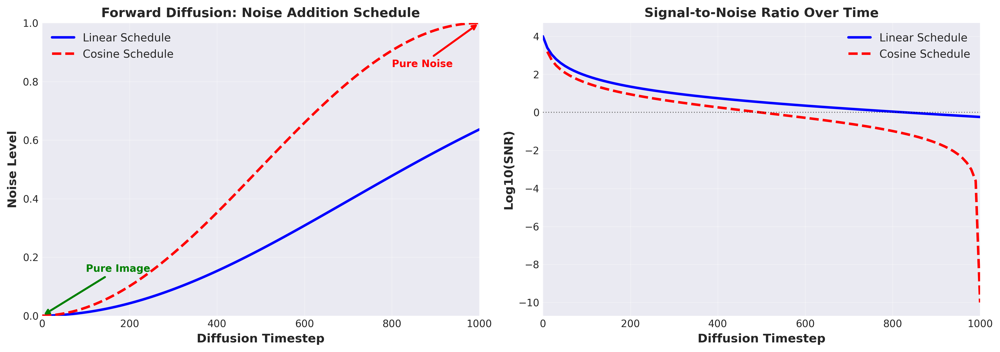

In [6]:
# Display noise schedule
display(Image('diagrams/noise_schedule.png'))

## 2.3 Key Parameters

### Classifier-Free Guidance (CFG) Scale
- Controls how closely output follows prompt
- **Low (1-5)**: More creative, may ignore prompt
- **Medium (7-10)**: Balanced (recommended)
- **High (15+)**: Very precise, may introduce artifacts

### Number of Steps
- More steps = better quality but slower
- **20-30 steps**: Good balance
- **50+ steps**: Diminishing returns

### Sampling Method
- **PNDM**: Pseudo Numerical Methods
- **DDIM**: Denoising Diffusion Implicit Models
- **DPM**: Diffusion Probabilistic Models

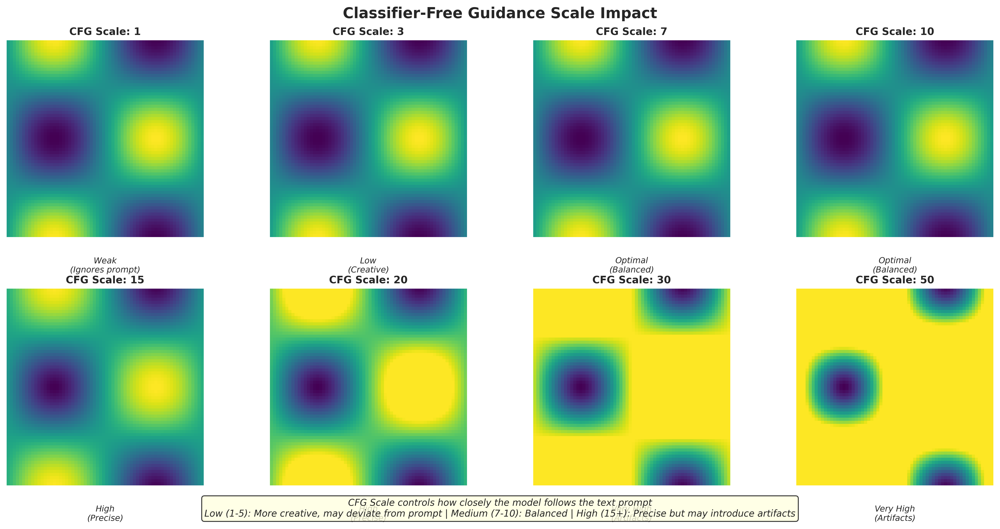

In [7]:
# Display guidance scale comparison
display(Image('diagrams/guidance_scale_comparison.png'))

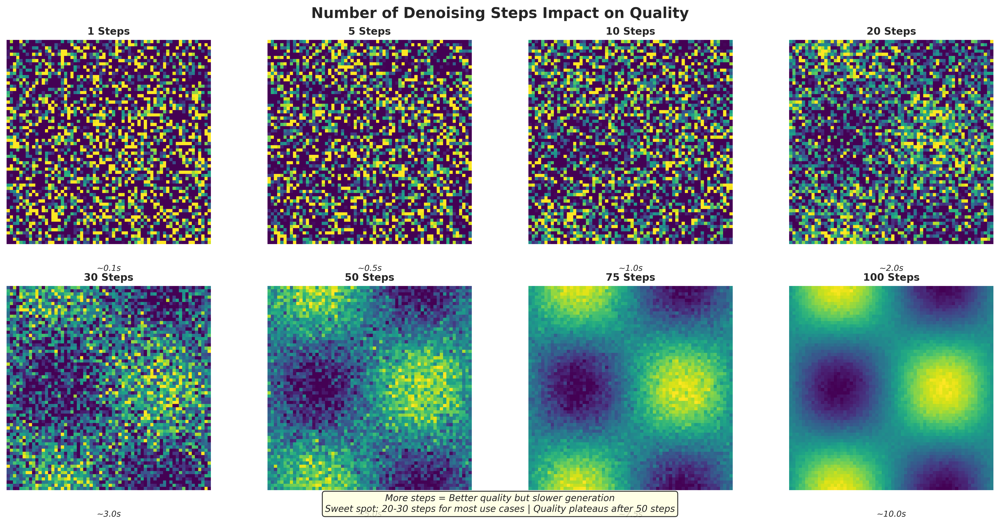

In [8]:
# Display sampling steps comparison
display(Image('diagrams/sampling_steps_comparison.png'))

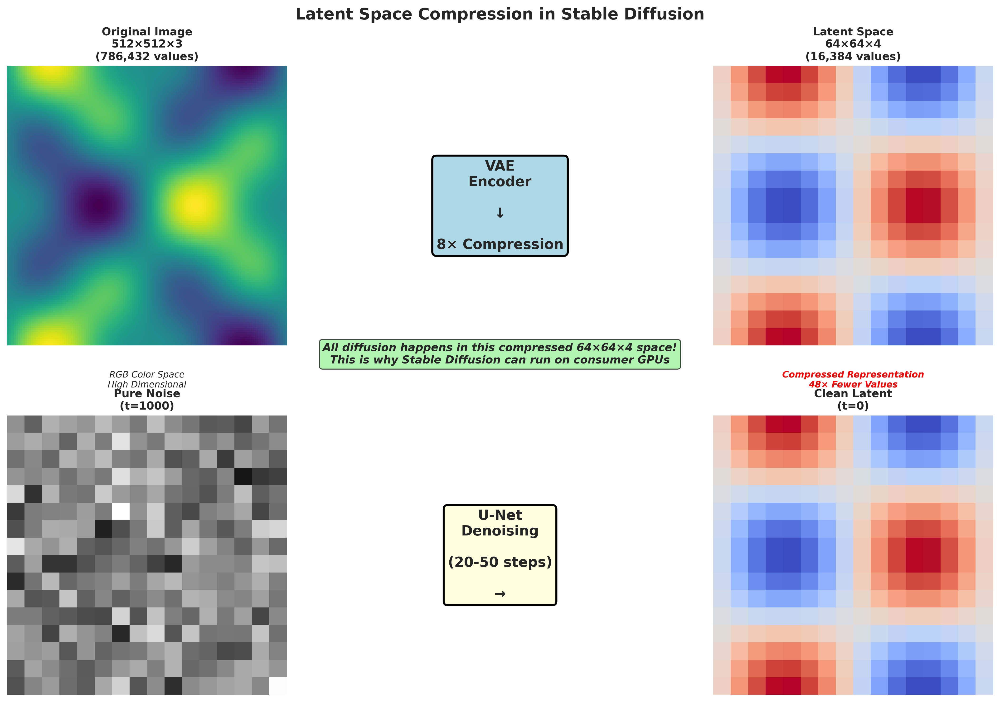

In [9]:
# Display latent space compression
display(Image('diagrams/latent_space_compression.png'))

### Key Takeaways: Diffusion Models

✓ **Diffusion** = gradual noise addition (forward) and removal (reverse)

✓ **Latent space** operations enable efficient generation

✓ **U-Net** performs denoising with text conditioning

✓ **CFG scale** and **steps** control quality-speed tradeoff

**Practical Application**: `stable_diffusion_generator/` directory

---
# Part 3: Large Language Models

## 3.1 Transformer Architecture

LLMs are built on the **Transformer architecture** (2017).

### Core Innovation: Self-Attention
- Allows model to focus on relevant parts of input
- Parallel processing (vs sequential RNNs)
- Captures long-range dependencies

### Three Types:
1. **Encoder-only**: BERT (understanding tasks)
2. **Decoder-only**: GPT, LLaMA (generation tasks)
3. **Encoder-decoder**: T5 (translation tasks)

We focus on **decoder-only** for text generation.

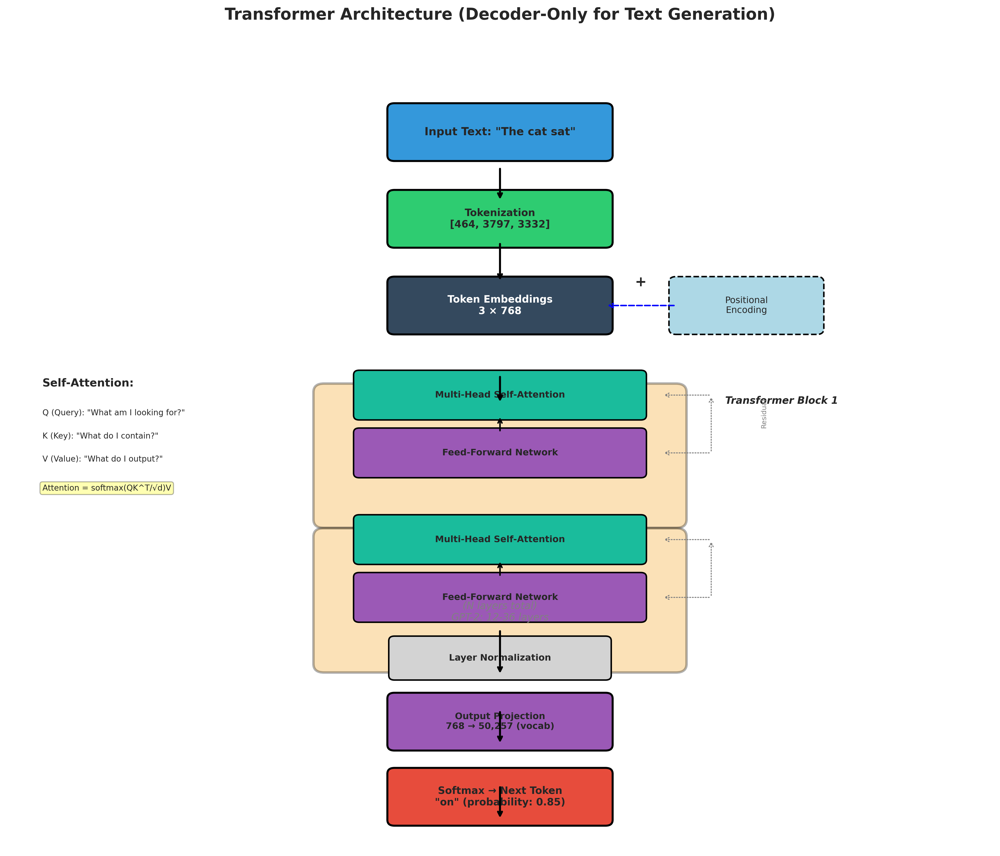

In [10]:
# Display transformer architecture
display(Image('diagrams/transformer_architecture.png'))

## 3.2 Attention Mechanism

### Query, Key, Value (Q, K, V)

**Intuition**: Like a database search
- **Query**: "What am I looking for?"
- **Key**: "What do I contain?"
- **Value**: "What do I output?"

### Formula:
```
Attention(Q, K, V) = softmax(Q @ K^T / √d_k) @ V
```

### Steps:
1. Compute similarity scores: Q @ K^T
2. Scale by √d_k (for stability)
3. Apply softmax (convert to probabilities)
4. Weighted sum of Values

### Multi-Head Attention:
- Run attention multiple times in parallel (8-32 heads)
- Each head learns different patterns:
  - Local context (adjacent words)
  - Long-range dependencies
  - Semantic relationships
  - Syntactic structure

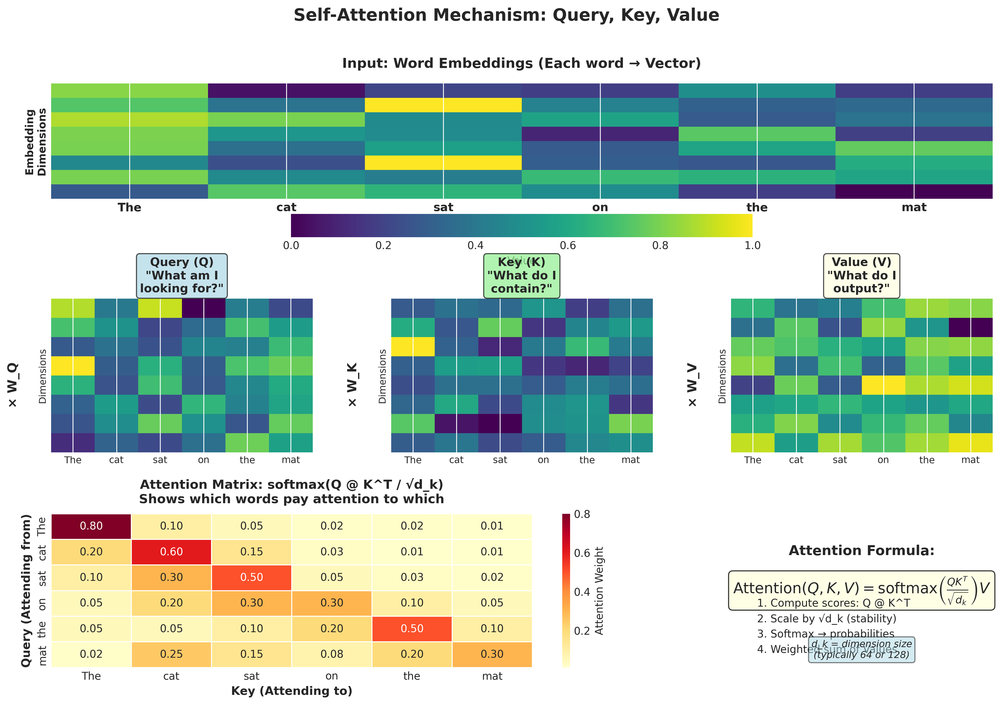

In [11]:
# Display attention mechanism
display(Image('diagrams/attention_mechanism.png'))

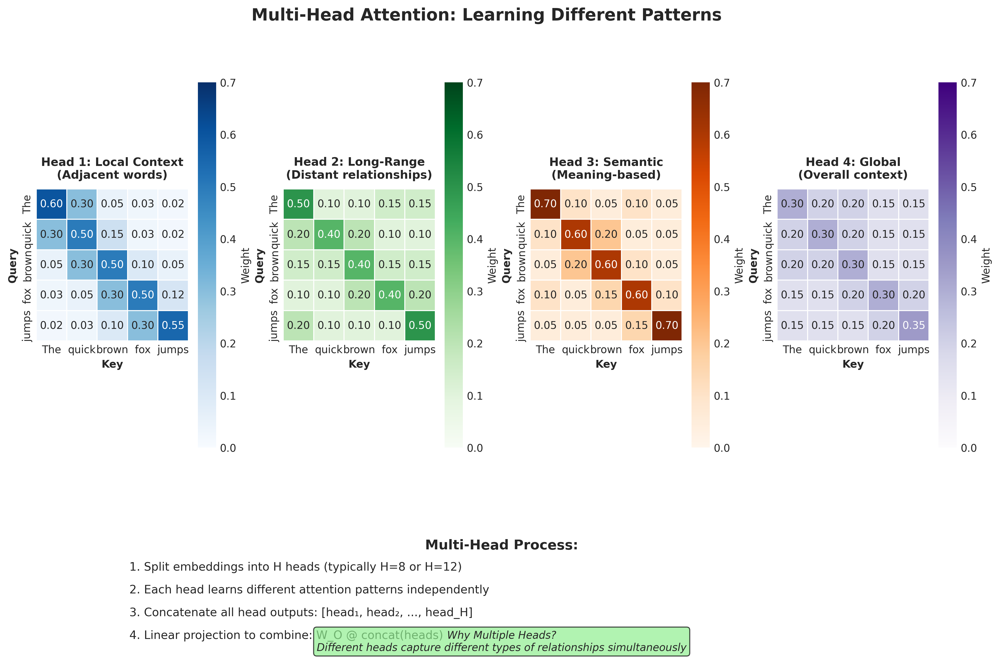

In [12]:
# Display multi-head attention
display(Image('diagrams/multi_head_attention.png'))

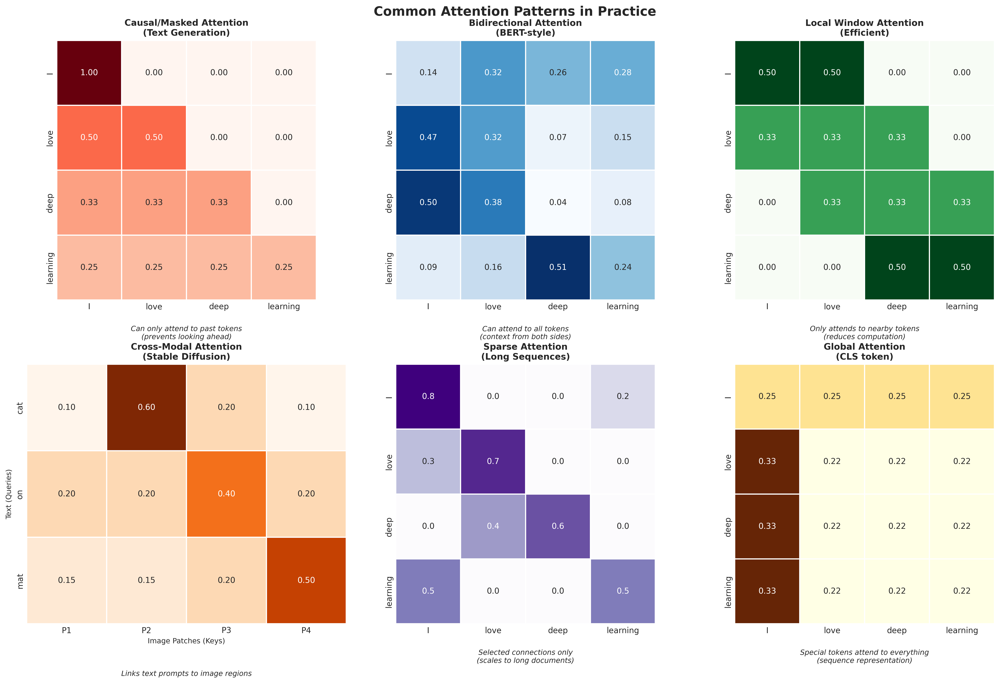

In [13]:
# Display attention patterns
display(Image('diagrams/attention_patterns.png'))

## 3.3 Tokenization

### Text → Tokens → Embeddings

**Tokenization**: Split text into subword units
- BPE (Byte-Pair Encoding) or SentencePiece
- Vocabulary: ~50,000 tokens
- Example: "unhappiness" → ["un", "happiness"]

**Token IDs**: Each token → unique integer

**Embeddings**: Each token ID → dense vector (768-4096 dim)

**Positional Encoding**: Add position information
- sin/cos functions at different frequencies
- Allows model to understand word order

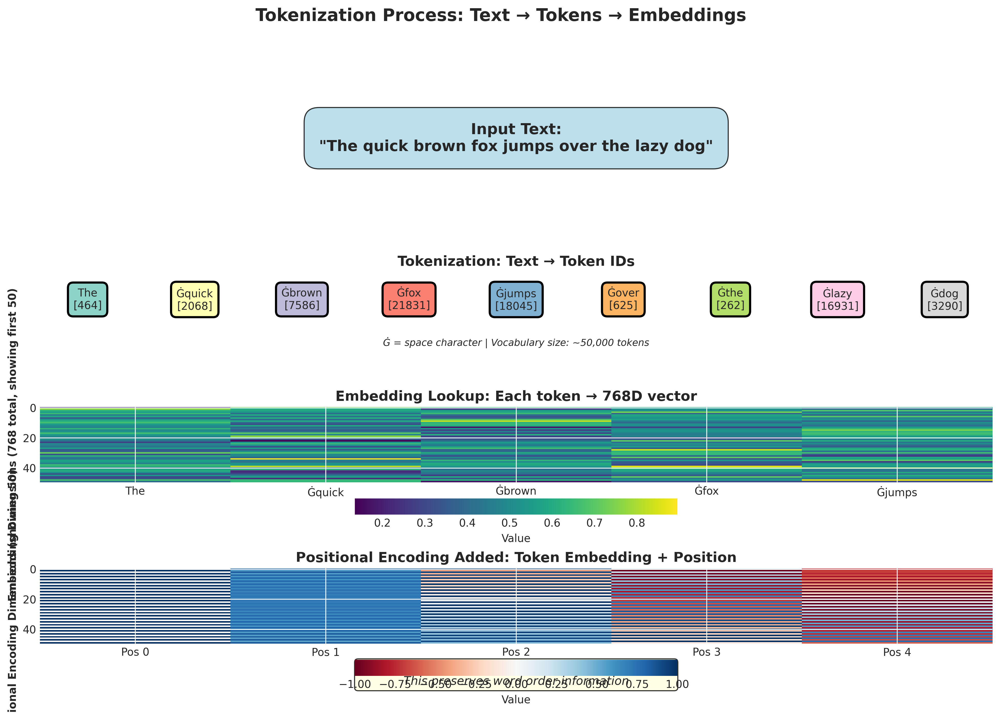

In [14]:
# Display tokenization process
display(Image('diagrams/tokenization_process.png'))

## 3.4 Autoregressive Generation

### How LLMs Generate Text

**Process**:
1. Input: "The cat"
2. Model predicts next token probabilities
3. Sample next token: "sat" (82% probability)
4. Append to input: "The cat sat"
5. Repeat until done

**Causal Masking**: Can only see past tokens, not future

**Stop Conditions**:
- End-of-sequence token
- Maximum length reached
- User-defined stopping criteria

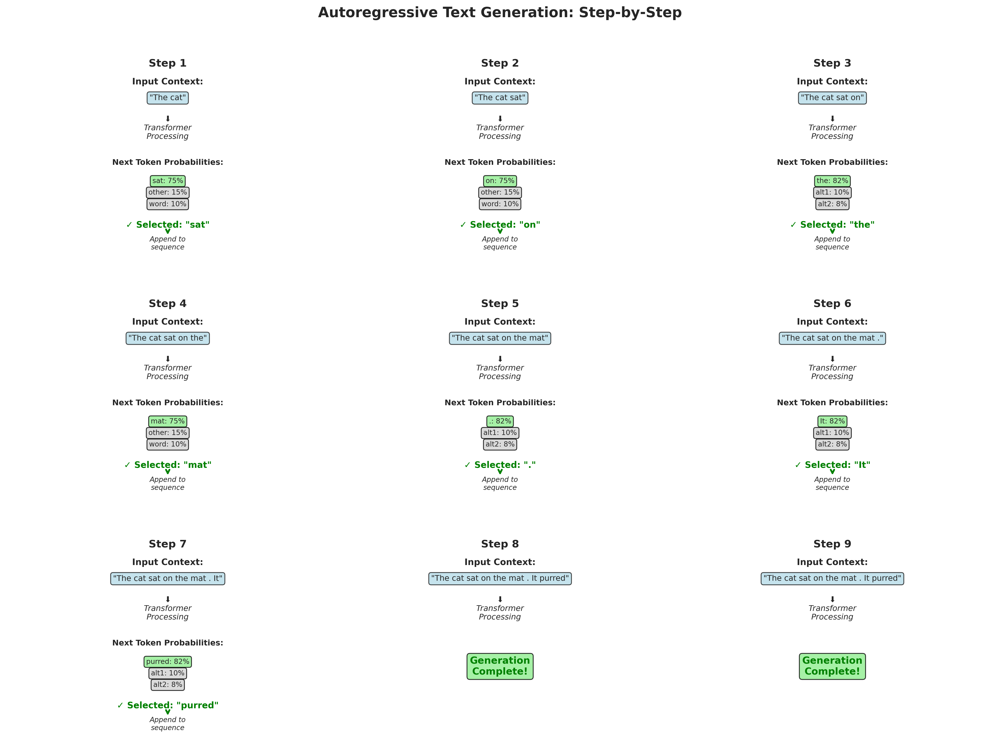

In [15]:
# Display autoregressive generation
display(Image('diagrams/autoregressive_generation.png'))

## 3.5 Sampling Strategies

Control randomness and creativity in generation.

### 1. Greedy Sampling
- Always pick highest probability token
- Deterministic output
- Low diversity

### 2. Temperature Sampling
- **T < 1**: More focused (sharpen distribution)
- **T = 1**: Original probabilities
- **T > 1**: More random (flatten distribution)
- Formula: `probs = softmax(logits / T)`

### 3. Top-k Sampling
- Only consider top k most likely tokens
- k = 50 is common
- Filters out unlikely tokens

### 4. Top-p (Nucleus) Sampling
- Consider tokens until cumulative probability ≥ p
- p = 0.9 is common
- Dynamic vocabulary size
- **Best quality** in most cases

### 5. Repetition Penalty
- Reduce probability of already-used tokens
- Prevents repetitive output
- Typical value: 1.1-1.2

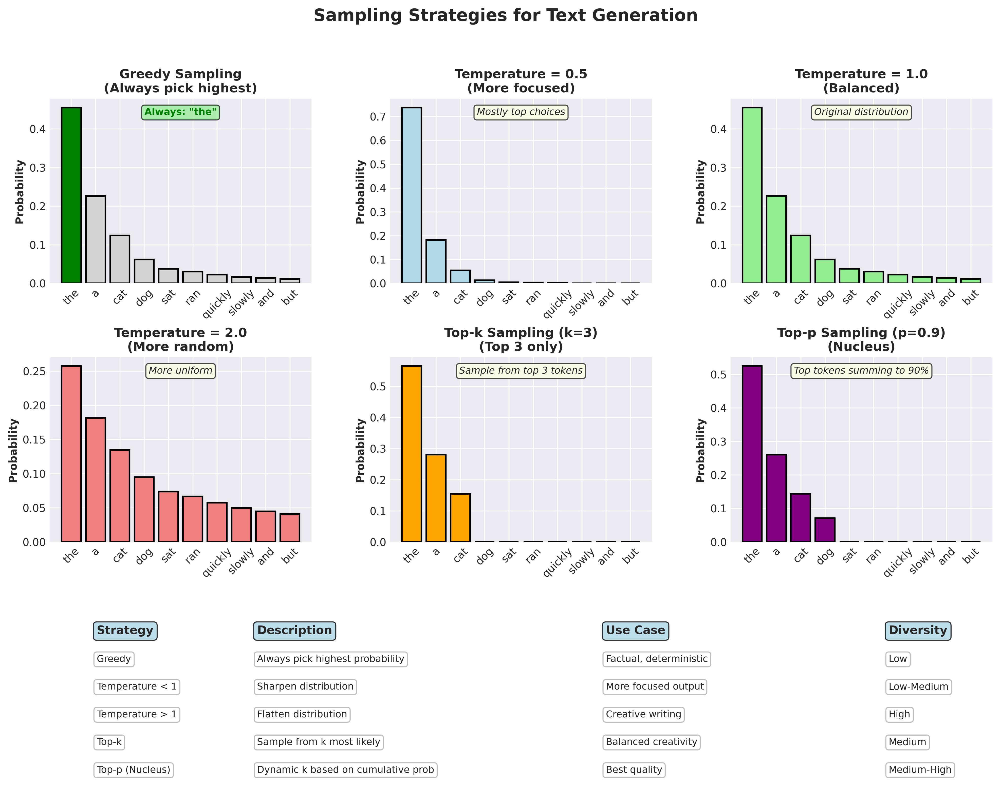

In [16]:
# Display sampling strategies
display(Image('diagrams/sampling_strategies.png'))

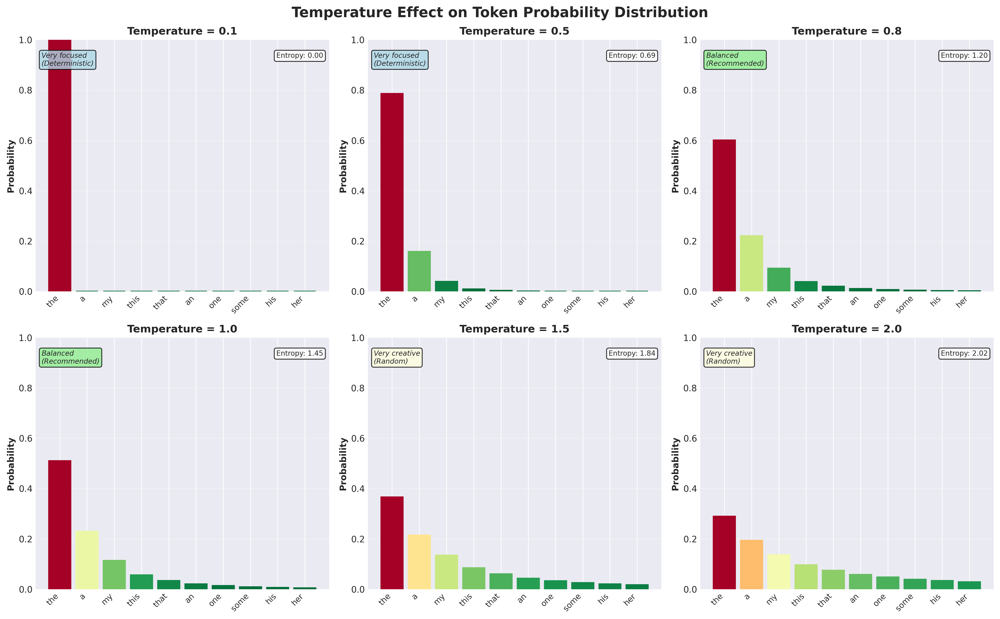

In [17]:
# Display temperature effect
display(Image('diagrams/temperature_effect.png'))

In [18]:
# Interactive: Temperature effect on sampling
def demonstrate_temperature_effect(temperature=1.0, show_top_k=10):
    """Show how temperature affects probability distribution"""
    # Simulated logits from model
    tokens = ['the', 'a', 'cat', 'dog', 'sat', 'ran', 'quickly', 'slowly', 'and', 'but',
              'very', 'quite', 'really', 'extremely', 'somewhat']
    logits = np.array([5.0, 4.5, 4.0, 3.5, 3.0, 2.5, 2.0, 1.5, 1.0, 0.5,
                      0.3, 0.2, 0.15, 0.1, 0.05])
    
    # Apply temperature
    if temperature > 0:
        probs = np.exp(logits / temperature) / np.exp(logits / temperature).sum()
    else:
        probs = np.zeros_like(logits)
        probs[0] = 1.0
    
    # Show only top-k
    top_k_indices = np.argsort(probs)[-show_top_k:][::-1]
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Plot
    colors = plt.cm.RdYlGn_r(probs[top_k_indices] / probs[top_k_indices].max())
    bars = ax.bar(range(show_top_k), probs[top_k_indices], color=colors,
                  edgecolor='black', linewidth=1.5)
    
    ax.set_xticks(range(show_top_k))
    ax.set_xticklabels([tokens[i] for i in top_k_indices], rotation=45, ha='right')
    ax.set_ylabel('Probability', fontsize=12, fontweight='bold')
    ax.set_title(f'Token Probability Distribution (Temperature = {temperature})',
                fontsize=14, fontweight='bold')
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, (bar, prob) in enumerate(zip(bars, probs[top_k_indices])):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{prob:.3f}', ha='center', va='bottom', fontsize=9)
    
    # Statistics
    entropy = -np.sum(probs * np.log(probs + 1e-10))
    max_prob = probs.max()
    
    stats_text = f'Entropy: {entropy:.2f}\nMax Probability: {max_prob:.3f}'
    ax.text(0.98, 0.95, stats_text, transform=ax.transAxes,
           ha='right', va='top', fontsize=10,
           bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    
    # Description
    if temperature <= 0.5:
        desc = 'Very Focused\n(Deterministic)'
    elif temperature <= 1.0:
        desc = 'Balanced\n(Recommended)'
    elif temperature <= 1.5:
        desc = 'Creative\n(Diverse)'
    else:
        desc = 'Very Random\n(Unpredictable)'
    
    ax.text(0.02, 0.95, desc, transform=ax.transAxes,
           ha='left', va='top', fontsize=11, fontweight='bold',
           bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout()
    plt.show()

# Interactive controls
interact(demonstrate_temperature_effect,
         temperature=widgets.FloatSlider(min=0.1, max=2.0, step=0.1, value=1.0, 
                                        description='Temperature:'),
         show_top_k=widgets.IntSlider(min=5, max=15, step=1, value=10,
                                     description='Show Top:'));

interactive(children=(FloatSlider(value=1.0, description='Temperature:', max=2.0, min=0.1), IntSlider(value=10…

## 3.6 Model Comparison

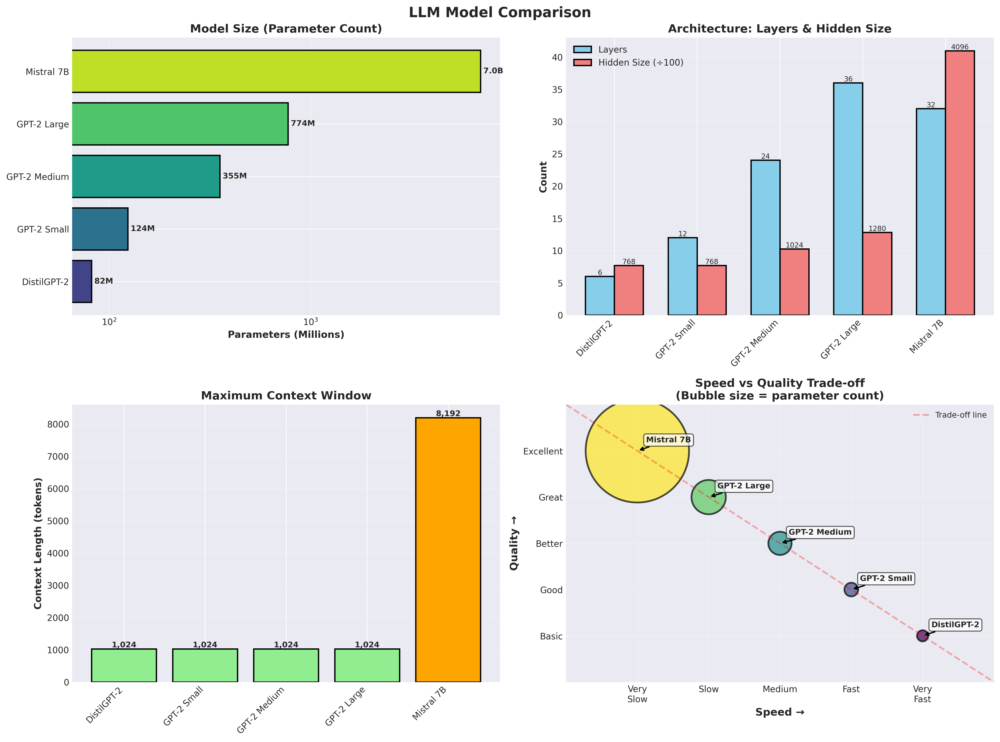

In [19]:
# Display LLM comparison
display(Image('diagrams/llm_model_comparison.png'))

### Key Takeaways: Large Language Models

✓ **Transformers** use self-attention for parallel processing

✓ **Q, K, V mechanism** enables focusing on relevant context

✓ **Multi-head attention** learns diverse patterns

✓ **Autoregressive generation** predicts one token at a time

✓ **Sampling strategies** control creativity and coherence

**Practical Application**: `llama_text_generator/` directory

---
# Part 4: Text-to-Audio (Speech Synthesis)

## 4.1 TTS Pipeline

### Components:

**1. Text Encoder**
- Converts text to linguistic features
- Tokenization and embeddings
- Phoneme prediction

**2. Acoustic Model**
- Text → Mel-spectrogram
- Transformer-based (e.g., Bark)
- Duration and pitch prediction

**3. Vocoder**
- Mel-spectrogram → Audio waveform
- Neural vocoder
- Output: 22.05 kHz WAV

### Modern Approach: End-to-End
- Single model for all steps
- Transformer-based
- Natural prosody and intonation

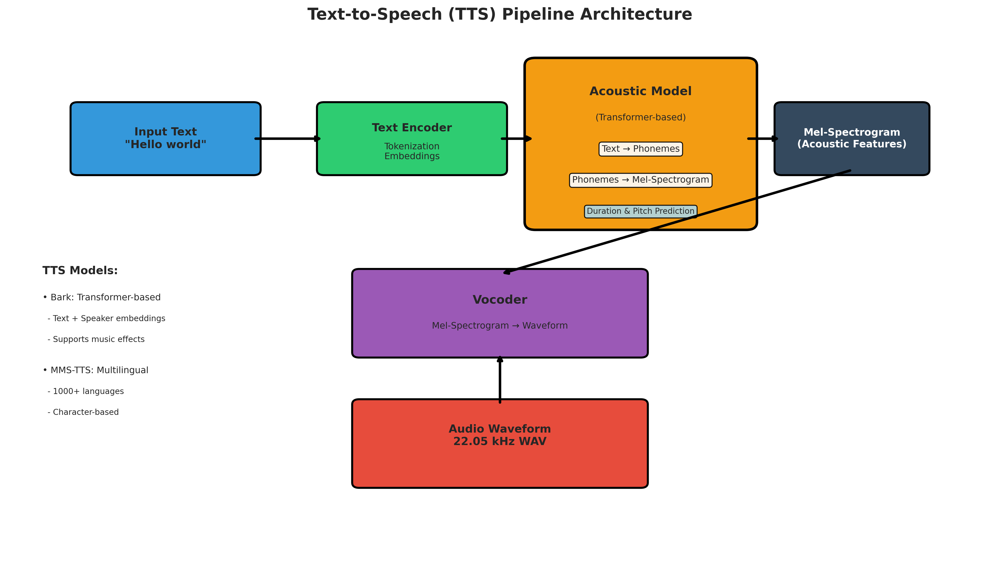

In [20]:
# Display TTS pipeline
display(Image('diagrams/tts_pipeline.png'))

## 4.2 Model Comparison

### Bark
- Transformer-based
- Supports music and sound effects
- Emotions and speaker cloning
- 13 languages
- Variants: Small (1GB), Full (3GB)

### MMS-TTS
- Meta's Massively Multilingual Speech
- 1,100+ languages
- Fast generation
- 800MB model
- Character-based

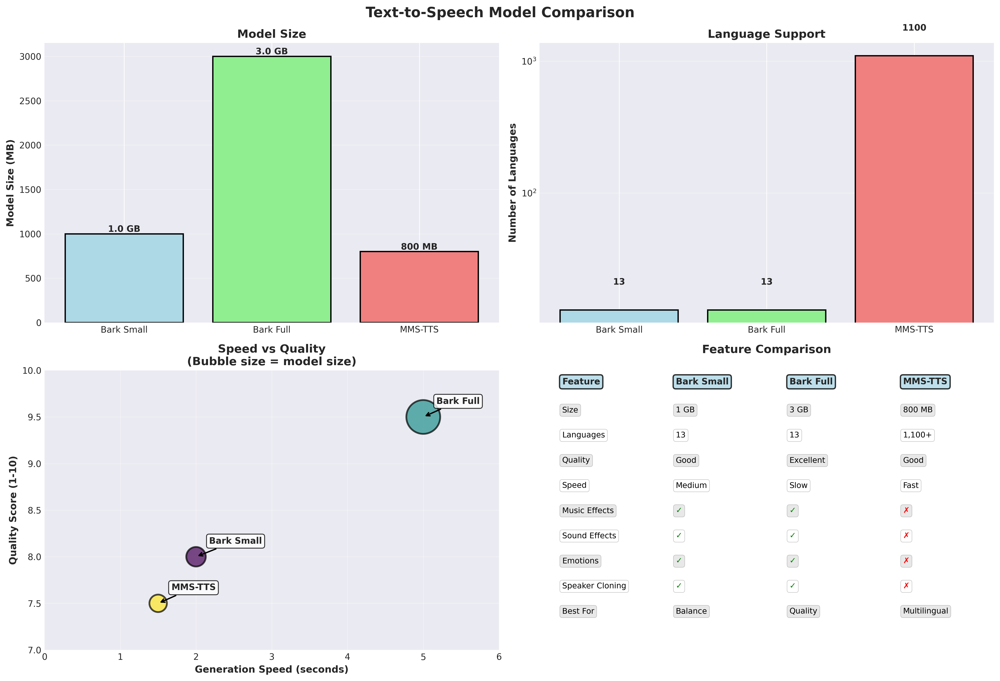

In [21]:
# Display TTS model comparison
display(Image('diagrams/tts_model_comparison.png'))

### Key Takeaways: Text-to-Audio

✓ **TTS pipeline**: Text → Acoustic features → Waveform

✓ **Transformers** enable natural prosody

✓ **Bark** offers creative features (music, SFX)

✓ **MMS-TTS** covers 1,100+ languages

**Practical Application**: `text_to_audio_generator/` directory

---
# Part 5: Image Super-Resolution

## 5.1 Super-Resolution Concept

**Goal**: Increase image resolution while adding realistic detail

### Traditional Upsampling vs Neural SR

**Traditional (Bicubic)**:
- Simple interpolation
- Blurry results
- No new detail

**Neural Super-Resolution**:
- Learns to hallucinate detail
- Sharp, realistic results
- Adds plausible textures

## 5.2 RRDB Architecture

### Residual in Residual Dense Block (Real-ESRGAN)

**Key Components**:

**1. Residual Dense Block (RDB)**
- Multiple conv layers with dense connections
- Each layer receives input from all previous layers
- Efficient feature reuse

**2. Residual Connections**
- Local: Within each RDB
- Global: Across entire network
- Enables deep networks (23+ layers)

**3. Upsampling**
- PixelShuffle (sub-pixel convolution)
- 2× → 4× (two PixelShuffle layers)
- Learnable upsampling

**4. GAN Training**
- Perceptual loss
- More realistic textures
- Better for photos

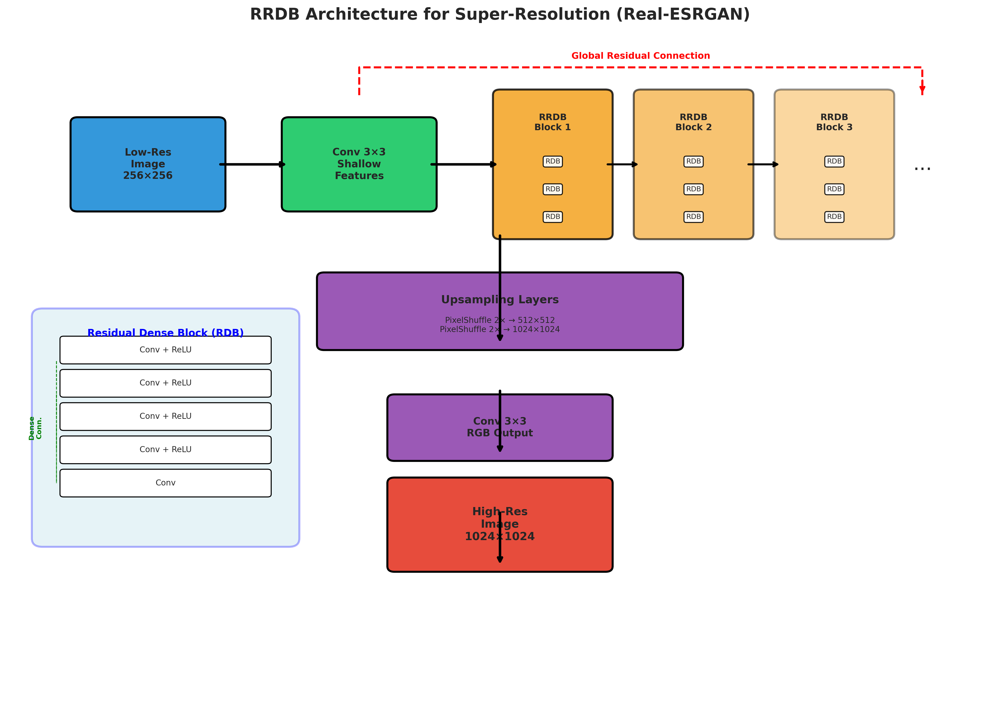

In [22]:
# Display RRDB architecture
display(Image('diagrams/rrdb_architecture.png'))

## 5.3 Model Comparison

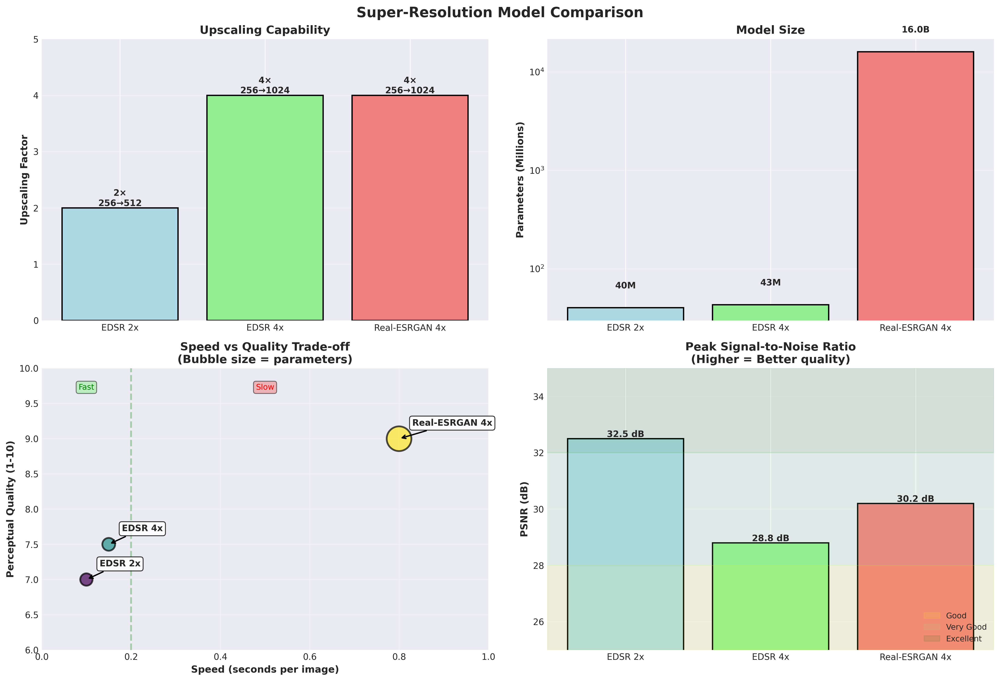

In [23]:
# Display upscaler comparison
display(Image('diagrams/upscaler_comparison.png'))

### Quality Metrics

**PSNR (Peak Signal-to-Noise Ratio)**
- Measures pixel-level accuracy
- Higher = better (dB)
- 28-32 dB: Very good
- 32+ dB: Excellent

**SSIM (Structural Similarity Index)**
- Measures perceptual quality
- 0-1 scale (higher = better)
- Better correlates with human perception

**Perceptual Quality**
- Human evaluation
- Texture realism
- Detail sharpness

### Key Takeaways: Super-Resolution

✓ **Neural SR** learns to add realistic detail

✓ **RRDB** uses dense connections for feature reuse

✓ **GAN training** improves perceptual quality

✓ **Real-ESRGAN** best for photos, EDSR for general use

**Practical Application**: `image_video_upscaler/` directory

---
# Summary and Comparison

## All Models Side-by-Side

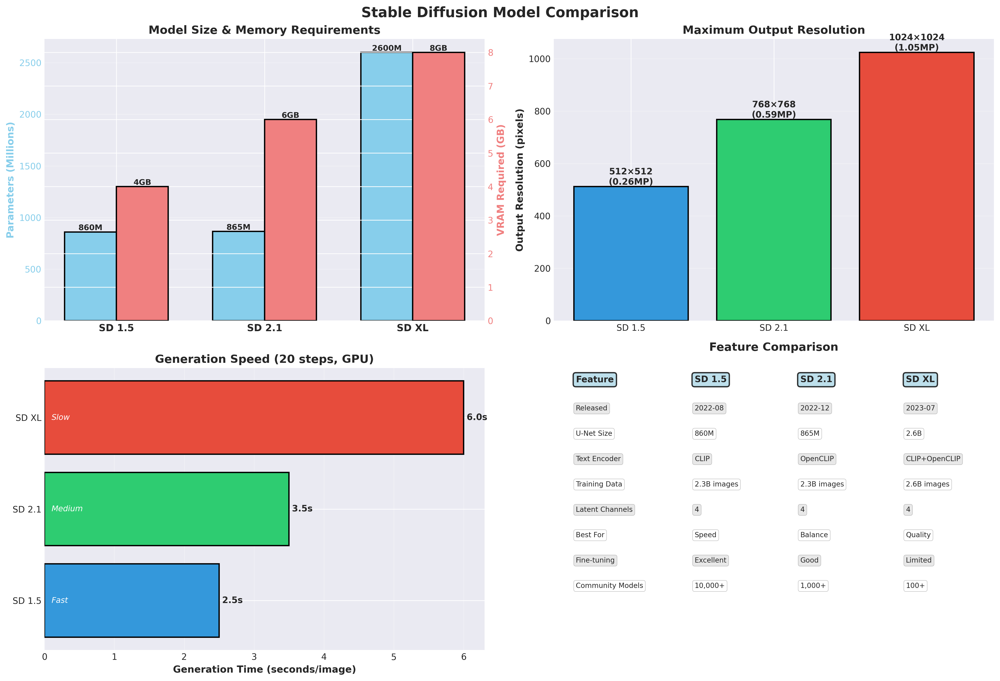

In [24]:
# Display all model comparisons
display(Image('diagrams/sd_model_comparison.png'))

## Unified Concepts Across All Models

### 1. Attention Mechanisms
- **Stable Diffusion**: Cross-attention (text-to-image)
- **LLMs**: Self-attention (within text)
- **TTS**: Both (text-to-acoustic)

### 2. Transformers
- Core architecture for all modern models
- Parallel processing
- Scalable to billions of parameters

### 3. Latent Representations
- **Stable Diffusion**: 64×64×4 latent space
- **LLMs**: Token embeddings (768-4096D)
- **TTS**: Mel-spectrograms
- **SR**: Feature maps in network

### 4. Sampling/Generation
- **Diffusion**: Iterative denoising
- **LLMs**: Autoregressive token prediction
- **TTS**: Sequence-to-sequence
- **SR**: Single-pass upsampling

### 5. Training Paradigms
- **Self-supervised**: Learn from unlabeled data
- **Large-scale**: Billions of examples
- **Transfer learning**: Fine-tune pre-trained models

---
# Appendix: Additional Visualizations

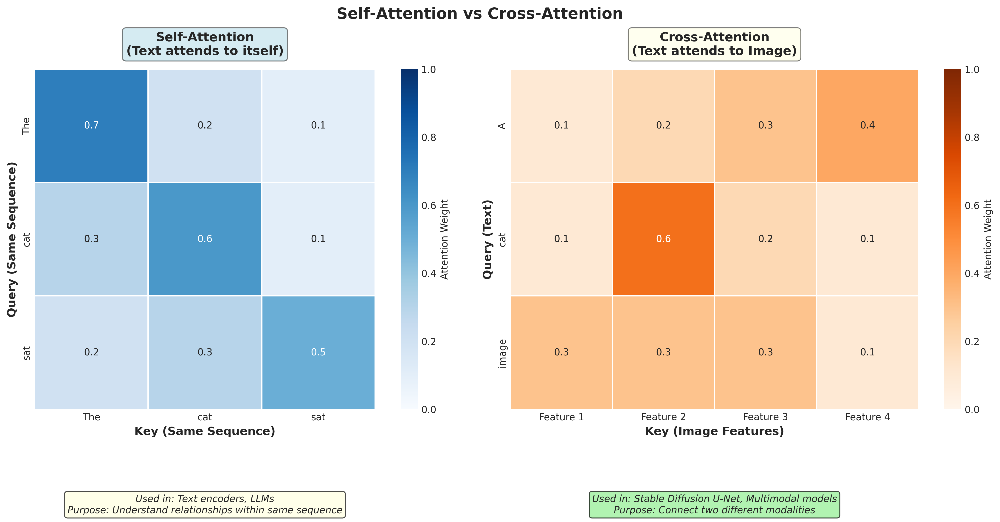

In [25]:
# Display self vs cross attention
display(Image('diagrams/self_vs_cross_attention.png'))

## Self-Attention vs Cross-Attention

**Self-Attention**:
- Sequence attends to itself
- Used in: LLMs, BERT
- Captures relationships within modality

**Cross-Attention**:
- One sequence attends to another
- Used in: Stable Diffusion U-Net
- Links different modalities (text ↔ image)

---
# Conclusion

## Key Concepts Mastered

✅ **Generative AI** creates new content from learned distributions

✅ **Diffusion models** generate images via iterative denoising

✅ **Transformers** use attention for parallel sequence processing

✅ **LLMs** generate text autoregressively with sampling strategies

✅ **TTS** converts text to natural speech via transformers

✅ **Super-resolution** adds realistic detail using neural networks

## Shared Principles

- **Attention mechanisms** enable focusing on relevant information
- **Latent spaces** provide efficient compressed representations
- **Large-scale training** on diverse data enables generalization
- **Sampling strategies** control output randomness and quality

